# Install & Import

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [1]:

# !pip install pandas-profiling[notebook]  
#!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
    
    
import numpy as np
import pandas as pd
import tensorflow as tf
import torch
import seaborn as sns
import matplotlib.pyplot as plt

from pandas_profiling import ProfileReport

from sklearn.datasets import fetch_openml
from scipy import stats
from statsmodels.datasets import get_rdataset
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller, kpss


from tqdm import tqdm, trange
import time

# for i in tqdm(range(100), desc="Test1") :
#     time.sleep(0.001)
    
# for i in tqdm(range(100), desc="Test2") :
#     time.sleep(0.001)

In [2]:
!pip install pqdm

You should consider upgrading via the 'C:\Users\SNUAI\anaconda3\python.exe -m pip install --upgrade pip' command.


# Check GPU is available 

In [2]:
physical_devices = tf.config.list_physical_devices('GPU')
print("# of GPUs : ", len(physical_devices))
from tensorflow.python.client import device_lib
import tensorflow as tf 
print(tf.config.list_logical_devices())
tf.debugging.set_log_device_placement(True)
#print("# of GPUs : ", len(physical_devices))


# of GPUs :  1
[LogicalDevice(name='/device:CPU:0', device_type='CPU'), LogicalDevice(name='/device:GPU:0', device_type='GPU')]


# Utility Functions

## Show basic info of np/df

In [3]:
# print np or df information
def print_data_info(data, msg="") :
    if( type(data) == type ( np.empty([2, 2]) ) ) :

        print("\n============================")
        print(msg)
        print("============================")
        print("Type : ",  type(data))
        print("Shape : ", data.shape)
        print("Unique : ", np.unique(data, return_counts=True))
        print("Data : ", data)
        print("============================\n")
    elif ( type(data) == type(pd.DataFrame([1])) ) :
        print("\n============================")
        print(msg)
        print("============================")
        print(type(data))
        print("Unique : ", np.unique(np.array(data), return_counts=True))
        print(data.info())
        print(data.head())
        print("============================\n")
    else :
        print("\n============================")
        print(msg)
        print("============================")
        print(type(data))
        print("Data : ", data)
        print("============================\n")
    

## Show Data Frame Analysis

In [4]:
df = pd.read_csv('https://raw.githubusercontent.com/JWarmenhoven/ISLR-python/master/Notebooks/Data/Advertising.csv', usecols=[1,2,3,4])

def boxplot(df, col):
    sns.boxplot(data=df,x=df[f"{col}"])
    plt.title(f"Feature {col}")
    plt.show()

def show_df_info(data, x=None, hue=None):
    print("show_df_info : ", x)
    display(data.head(3))

    fig, axes = plt.subplots(1,2, figsize=(10, 5))
    # fig.suptitle('Features')
    #sns.histplot(data=penguins, x="flipper_length_mm", kde=True)
    #sns.histplot(x=x, data=data, kde=True, hue=hue)

    sns.histplot(ax=axes[0], data=data, x=x, kde=True) #, hue=hue)    
    sns.boxplot(ax=axes[1], data=data[x])
    plt.show()


def print_df_info(df) :
    print("====================================================================")
    print("=           DataFrame Information                                  =")
    print("====================================================================")
    print(df.info())

    print("====================================================================")
    display(df.head(3))
    print("====================================================================")
    print()


    print("====================================================================")
    print("[Columns]\t", df.columns)
    print("====================================================================")
    print()

    print("====================================================================")
    print("[INDICES]\t",df.index)
    print("====================================================================")

    print()
    print("====================================================================")
    print("=           DataFrame Description                                  =")
    print("====================================================================")

    print(df.describe())
    print("====================================================================")



    for col in df.columns :
        print("====================================================================")
        print("[ " +  str(col) + " ]")
        print("====================================================================")
        show_df_info(df, col)

        print(str(col) + "   Unique : ", df[col].unique())
        print("--------------------------------------------------------------------")
        print(str(col) + "   N unique : ", df[col].nunique())
        print("--------------------------------------------------------------------")
        print(str(col) + "   Value Counts : ", df[col].value_counts())
        print("--------------------------------------------------------------------")
        print()
        print()
        print()

        
    sns.pairplot(df)
    plt.show()

    plt.figure(figsize=(15, 10))
    sns.heatmap(df, cmap=sns.cubehelix_palette(as_cmap=True))
    plt.show()


# print_df_info(df)

# Read Data

In [5]:

path = './data'

#!ls ./

df_strain = pd.read_csv(f'{path}/S_train.csv')
df_xtrain = pd.read_csv(f'{path}/X_train.csv')
df_xtest = pd.read_csv(f'{path}/X_test.csv')
df_ytrain = pd.read_csv(f'{path}/Y_train.csv')

In [6]:
!ls '/content/drive/MyDrive/Colab Notebooks/data'
!pwd

ls: cannot access '/content/drive/MyDrive/Colab Notebooks/data': No such file or directory


/c/Users/SNUAI/Excercise/ML_Excercise/ML_SNU


# Show DataFrame Info (0/1/2/3)

In [7]:


display(df_strain.head(2))
display(df_ytrain.head(2))

df_sy = pd.concat([df_strain, df_ytrain], axis=1)
display(df_sy.head(3))
df_sy.columns = ["yield", "class"]
display(df_sy.head(3))

# print_df_info(df_xtrain)
# print_df_info(df_ytrain)
# print_df_info(df_strain)
# print_df_info( (df_sy.loc[ df_sy["class"]==0, : ]) )
# print_df_info( (df_sy.loc[ df_sy["class"]==1, : ]) )
# print_df_info( (df_sy.loc[ df_sy["class"]==2, : ]) )
# print_df_info( (df_sy.loc[ df_sy["class"]==3, : ]) )



,0
0,0.933333
1,0.966667


,0
0,0
1,0


,0,0
0,0.933333,0
1,0.966667,0
2,1.000000,0


,yield,class
0,0.933333,0
1,0.966667,0
2,1.000000,0


# Continuous & Discrete Data Exploration

In [8]:
df_xtrain_continuous = df_xtrain.iloc[:,:92]
df_xtrain_discrete = df_xtrain.iloc[:,93:2090]
df_xtrain_continuous_T = df_xtrain.iloc[:,:92].T
df_xtrain_discrete_T = df_xtrain.iloc[:,93:2090].T


In [9]:
def gen_profile():
    profile = ProfileReport(df_xtrain_continuous, minimal=True,explorative=True)
    # for large dataset minimal is True, and explorative as True
    # profile.widgets()
    # Saving file to in JSON and HTML format
    # To HTML
    profile.to_file(f"{path}/df_xtrain_continuous_1208_01.html")
    # # To JSON
    # json_data = profile.to_json()
    # # As a file
    # profile.to_file("your_report.json")

    profile = ProfileReport(df_xtrain_discrete, minimal=True,explorative=True)
    # profile.widgets()
    profile.to_file(f"{path}/df_xtrain_discrete_1208_01.html")

    profile = ProfileReport(df_xtrain_continuous_Y, minimal=True,explorative=True)
    # profile.widgets()
    profile.to_file(f"{path}/df_xtrain_continuous_1208_01.html")

    profile = ProfileReport(df_xtrain_discrete_T, minimal=True,explorative=True)
    # profile.widgets()
    profile.to_file(f"{path}/df_xtrain_discrete_T_1208_01.html")
    
############################################
# gen_profile()

## Check Distribution of Each Class (Continual data 0~92)

,0,1,2,3,4,5,6,7,8,9,...,83,84,85,86,87,88,89,90,91,class
0,2699,17997,0,7262,13700,11147,10643,0,10932,8115,...,7189,11865,5179,6750,8684,5647,10978,4233,3270,0
1,2274,18152,0,6745,14012,11664,9310,0,12054,6974,...,8400,13337,4762,6763,8084,5706,11107,3759,4347,0
2,2450,18228,0,7058,12814,13077,10697,0,10639,8944,...,7719,13720,4576,6038,6995,4912,12468,4415,3342,0


Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60',
       '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72',
       '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84',
       '85', '86', '87', '88', '89', '90', '91', 'class'],
      dtype='object')


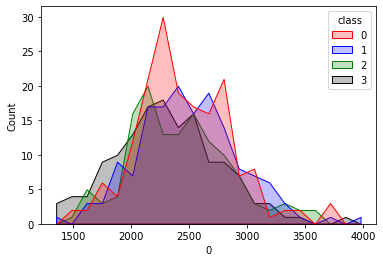

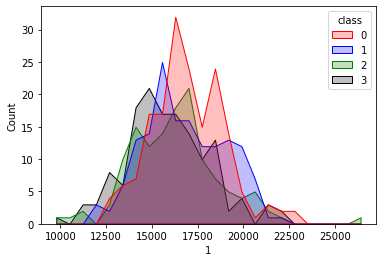

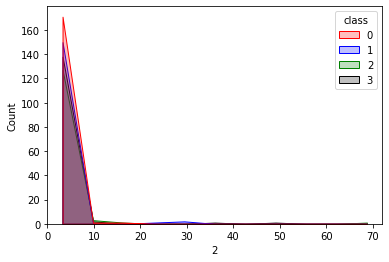

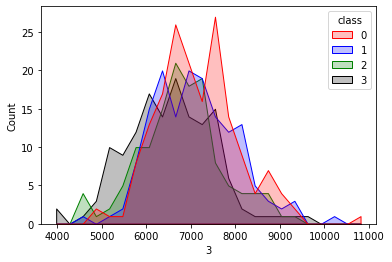

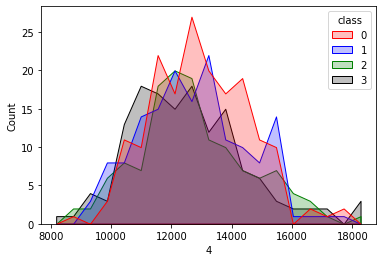

...

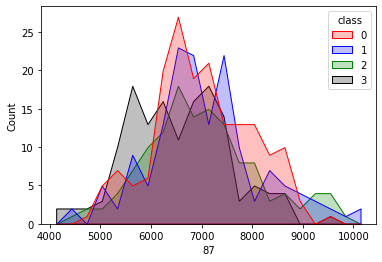

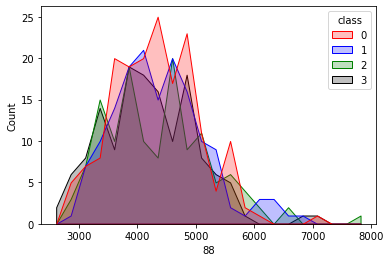

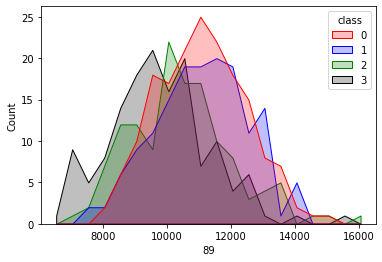

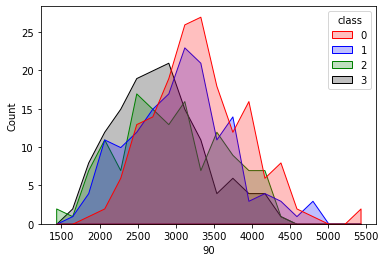

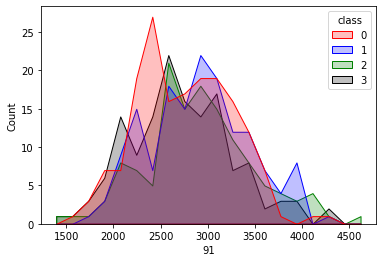

In [10]:
# display(df_strain.head(2))
# display(df_ytrain.head(2))
plt.rcParams.update({'figure.max_open_warning': 0})

df_ytrain.rename(columns = {'0' : 'class'}, inplace = True)

df_xy = pd.concat([df_xtrain.iloc[:,0:92], df_ytrain], axis=1)
display(df_xy.head(3))
#df_sy.columns = ["yield", "class"]

# print_df_info( (df_xy.iloc[ df_sy["class"]==0, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==1, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==2, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==3, : ]) )

print(df_xy.columns)


#fig, axes = plt.subplots(24,4, figsize=(200, 200))
# for i in range(0,92) :
#     sns.histplot(ax=axes[i//4, i%4], data=df_xy, x=str(i), hue="class", element="poly")
# plt.show()

from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('xtrain_0to92_class_dist_1209.pdf') as pdf_pages:
    for i in range(0,92) :
        fig = plt.figure(i)
        sns.histplot(data=df_xy, x=str(i), hue="class", element="poly", palette=['red', 'blue', 'green', 'black'])
        plt.show()
        fig.savefig(pdf_pages, format='pdf')


In [ ]:
from tqdm import tqdm, trange
import time

for i in tqdm(range(100), desc="Test1") :
    time.sleep(0.001)
    
for i in tqdm(range(100), desc="Test2") :
    time.sleep(0.001)

## Check Distribusion of Each Class and A/B for 2191~2193/yield

In [18]:
## X col 2191~2193   +   S   +   Y
df_xsy = pd.concat([df_xtrain.iloc[:, 2191:2194], df_sy], axis=1)

display(type(df_xsy))
display(df_xsy.head(3))
print(df_xsy.loc[:, "2193"])

col = "2193"
df_xsy.loc[(df_xsy["2193"] == 'A'),col]=0
df_xsy.loc[(df_xsy["2193"] == 'B'),col]=1

print(df_xsy.loc[:, "2193"])

pandas.core.frame.DataFrame

,2191,2192,2193,yield,class
0,34.9,0.9,A,0.933333,0
1,26.4,0.8,B,0.966667,0
2,29.4,0.8,A,1.000000,0


0      A
1      B
2      A
3      A
4      B
      ..
595    A
596    B
597    B
598    A
599    B
Name: 2193, Length: 600, dtype: object
0      0
1      1
2      0
3      0
4      1
      ..
595    0
596    1
597    1
598    0
599    1
Name: 2193, Length: 600, dtype: object


0it [00:00, ?it/s]

0 2191
[ 4.6  5.3  6.3  7.2  7.8  8.   8.5  8.6  9.   9.4  9.8  9.9 10.  10.2
 10.4 11.1 11.4 11.6 11.7 12.1 12.2 12.3 12.4 12.5 12.7 12.9 13.1 13.3
 13.7 14.  14.2 14.3 14.4 14.5 14.6 14.7 14.8 14.9 15.  15.2 15.3 15.4
 15.5 15.6 15.7 15.8 15.9 16.  16.4 16.6 17.1 17.2 17.3 17.5 17.6 17.7
 17.9 18.  18.1 18.2 18.4 18.5 18.6 18.9 19.  19.1 19.2 19.3 19.4 19.5
 19.6 19.7 19.8 20.  20.1 20.2 20.3 20.5 20.6 20.7 20.8 20.9 21.  21.1
 21.2 21.3 21.4 21.5 21.6 21.7 21.9 22.  22.1 22.2 22.3 22.4 22.5 22.6
 22.7 22.8 22.9 23.  23.2 23.3 23.4 23.5 23.6 23.7 23.8 23.9 24.  24.1
 24.2 24.3 24.4 24.5 24.6 24.7 24.8 24.9 25.  25.1 25.2 25.3 25.4 25.5
 25.6 25.7 25.8 25.9 26.  26.1 26.2 26.3 26.4 26.5 26.6 26.7 26.8 26.9
 27.  27.1 27.2 27.3 27.4 27.5 27.6 27.7 27.8 27.9 28.  28.1 28.2 28.3
 28.4 28.5 28.6 28.7 28.9 29.  29.1 29.2 29.3 29.4 29.5 29.6 29.7 29.8
 29.9 30.  30.1 30.2 30.3 30.4 30.5 30.6 30.8 30.9 31.  31.1 31.2 31.3
 31.4 31.5 31.6 31.7 31.8 31.9 32.  32.1 32.2 32.3 32.4 32.5 32.6 32.7

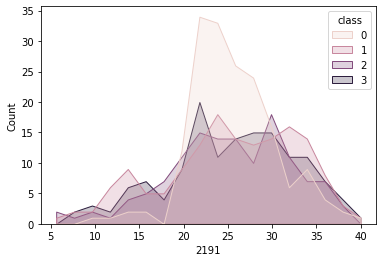

1it [00:00,  6.27it/s]

1 2192
[0.2  0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9
 0.95 1.  ]


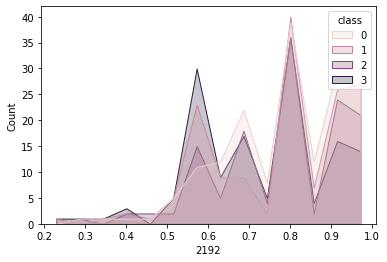

2it [00:00,  3.31it/s]

2 2193
[0 1]


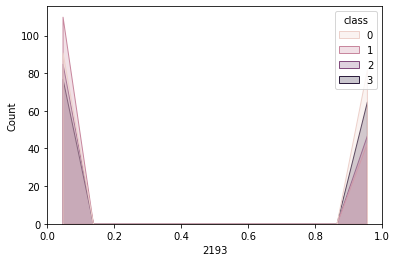

3it [00:00,  4.52it/s]

3 yield
[0.6        0.66666667 0.7        0.73333333 0.76666667 0.8
 0.83333333 0.86666667 0.9        0.93333333 0.96666667 1.        ]


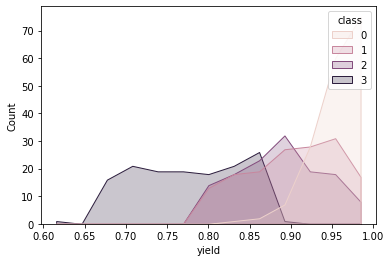

5it [00:00,  5.94it/s]


4 class
[0 1 2 3]


0it [00:00, ?it/s]

0 2191
[ 4.6  5.3  6.3  7.2  7.8  8.   8.5  8.6  9.   9.4  9.8  9.9 10.  10.2
 10.4 11.1 11.4 11.6 11.7 12.1 12.2 12.3 12.4 12.5 12.7 12.9 13.1 13.3
 13.7 14.  14.2 14.3 14.4 14.5 14.6 14.7 14.8 14.9 15.  15.2 15.3 15.4
 15.5 15.6 15.7 15.8 15.9 16.  16.4 16.6 17.1 17.2 17.3 17.5 17.6 17.7
 17.9 18.  18.1 18.2 18.4 18.5 18.6 18.9 19.  19.1 19.2 19.3 19.4 19.5
 19.6 19.7 19.8 20.  20.1 20.2 20.3 20.5 20.6 20.7 20.8 20.9 21.  21.1
 21.2 21.3 21.4 21.5 21.6 21.7 21.9 22.  22.1 22.2 22.3 22.4 22.5 22.6
 22.7 22.8 22.9 23.  23.2 23.3 23.4 23.5 23.6 23.7 23.8 23.9 24.  24.1
 24.2 24.3 24.4 24.5 24.6 24.7 24.8 24.9 25.  25.1 25.2 25.3 25.4 25.5
 25.6 25.7 25.8 25.9 26.  26.1 26.2 26.3 26.4 26.5 26.6 26.7 26.8 26.9
 27.  27.1 27.2 27.3 27.4 27.5 27.6 27.7 27.8 27.9 28.  28.1 28.2 28.3
 28.4 28.5 28.6 28.7 28.9 29.  29.1 29.2 29.3 29.4 29.5 29.6 29.7 29.8
 29.9 30.  30.1 30.2 30.3 30.4 30.5 30.6 30.8 30.9 31.  31.1 31.2 31.3
 31.4 31.5 31.6 31.7 31.8 31.9 32.  32.1 32.2 32.3 32.4 32.5 32.6 32.7

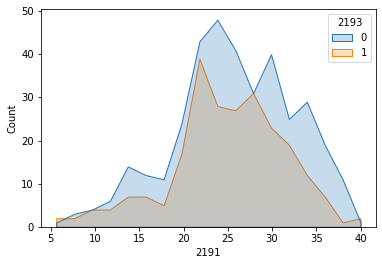

1it [00:00,  7.14it/s]

1 2192
[0.2  0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9
 0.95 1.  ]


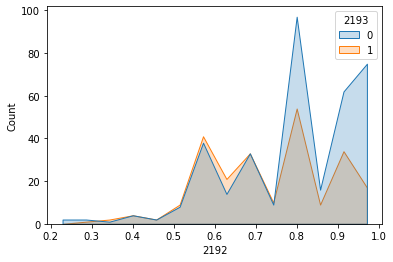

2it [00:00,  7.00it/s]

2 2193
[0 1]
3 yield
[0.6        0.66666667 0.7        0.73333333 0.76666667 0.8
 0.83333333 0.86666667 0.9        0.93333333 0.96666667 1.        ]


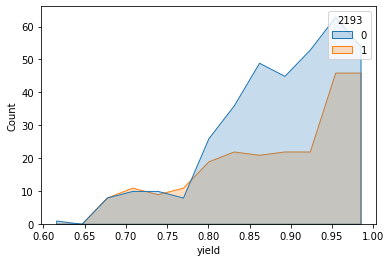

4it [00:00,  9.92it/s]

4 class
[0 1 2 3]


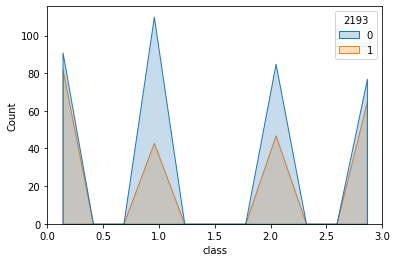

5it [00:00,  8.57it/s]


In [65]:

list_xsy_col_name = list(df_xsy.columns)
list_xsy_col_name

## Dist by Class 
with PdfPages('xsy_2191to2193_dist.pdf') as pdf_pages:
    for i, col in tqdm(enumerate(list_xsy_col_name)) :
        print(i,str(col))
        print(np.unique(np.array(df_xsy.loc[:,str(col)])))
        if str(col) == "class" : 
            pass
        else :
            fig = plt.figure(i)
            sns.histplot(data=df_xsy, x=str(col), hue="class", element="poly")
            plt.show()
            fig.savefig(pdf_pages, format='pdf')

## Dist by A/B (2193)
    for i, col in tqdm(enumerate(list_xsy_col_name)) :
        print(i,str(col))
        print(np.unique(np.array(df_xsy.loc[:,str(col)])))
        if str(col) == "2193" : 
            pass
        else :
            fig = plt.figure(i)
            sns.histplot(data=df_xsy, x=str(col), hue="2193", element="poly")
            plt.show()
            fig.savefig(pdf_pages, format='pdf')
            
# fig, axes = plt.subplots(24,4, figsize=(200, 200))
# for i in range(0,5) :
#     sns.histplot(ax=axes[i//4, i%4], data=df_xy, x=str(i), hue="class", element="poly")
# plt.show()


## Check Distribution of Each Class (Continual data 0~92 + A/B)

,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,class,2191,2192,2193,yield
0,2699,17997,0,7262,13700,11147,10643,0,10932,8115,...,8684,5647,10978,4233,3270,0,34.9,0.9,0,0.933333
1,2274,18152,0,6745,14012,11664,9310,0,12054,6974,...,8084,5706,11107,3759,4347,0,26.4,0.8,1,0.966667
2,2450,18228,0,7058,12814,13077,10697,0,10639,8944,...,6995,4912,12468,4415,3342,0,29.4,0.8,0,1.000000


Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60',
       '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72',
       '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84',
       '85', '86', '87', '88', '89', '90', '91', 'class', '2191', '2192',
       '2193', 'yield'],
      dtype='object')


,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,class,2191,2192,2193,yield
0,2699,17997,0,7262,13700,11147,10643,0,10932,8115,...,8684,5647,10978,4233,3270,0,34.9,0.9,0,0.933333
2,2450,18228,0,7058,12814,13077,10697,0,10639,8944,...,6995,4912,12468,4415,3342,0,29.4,0.8,0,1.000000
3,2516,18368,8,6196,13503,14309,13317,0,10434,8250,...,7726,4756,15490,1967,4332,3,27.6,0.6,0,0.733333


,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,class,2191,2192,2193,yield
1,2274,18152,0,6745,14012,11664,9310,0,12054,6974,...,8084,5706,11107,3759,4347,0,26.4,0.8,1,0.966667
4,1952,15859,0,7445,10656,9714,7970,0,9518,6422,...,6112,5091,9215,3805,2418,0,39.7,0.8,1,1.000000
5,2002,15546,0,6980,11661,9730,8473,0,10488,7686,...,5295,3772,9934,4191,1449,2,15.3,0.8,1,0.900000


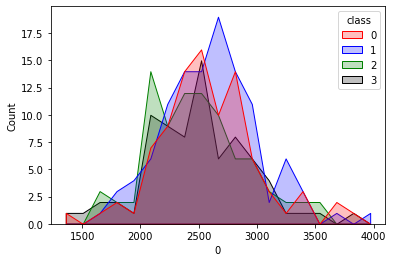

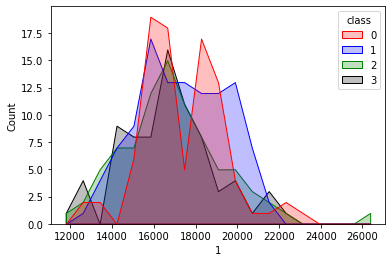

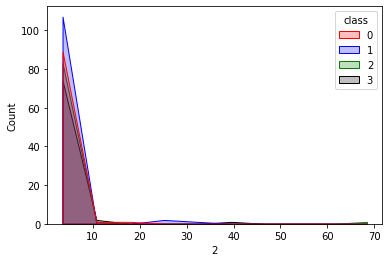

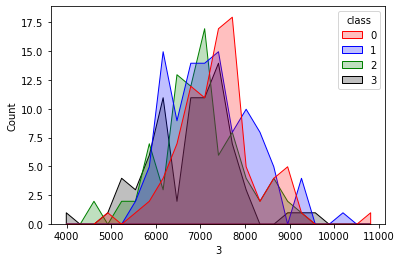

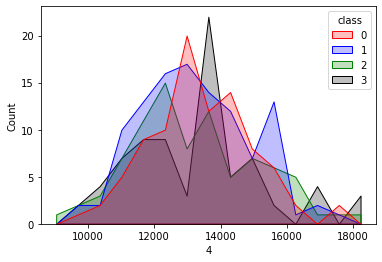

...

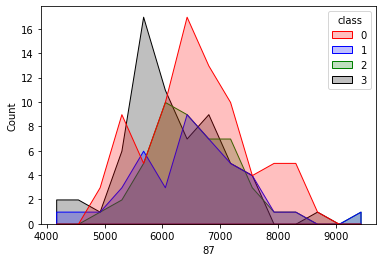

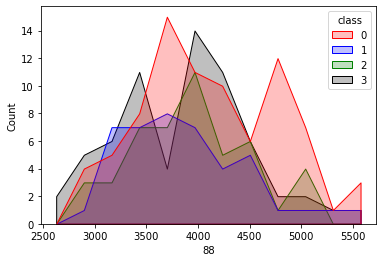

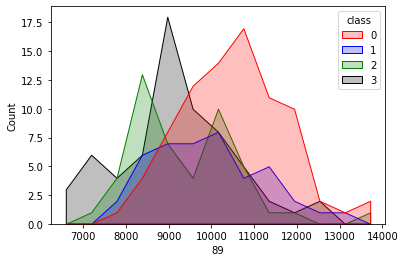

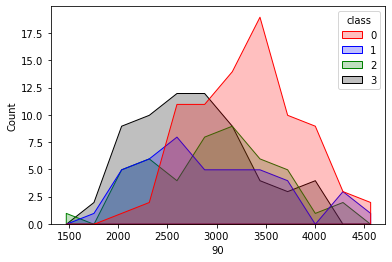

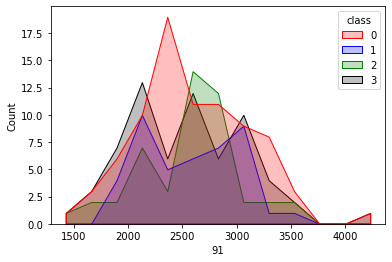

In [37]:
# display(df_strain.head(2))
# display(df_ytrain.head(2))
plt.rcParams.update({'figure.max_open_warning': 0})

df_ytrain.rename(columns = {'0' : 'class'}, inplace = True)

df_xsy_all = pd.concat([df_xy, df_xsy], axis=1)
df_xsy_all = df_xsy_all.iloc[:,:-1]
display(df_xsy_all.head(3))
#df_sy.columns = ["yield", "class"]

# print_df_info( (df_xy.iloc[ df_sy["class"]==0, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==1, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==2, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==3, : ]) )

print(df_xsy_all.columns)


#fig, axes = plt.subplots(24,4, figsize=(200, 200))
# for i in range(0,92) :
#     sns.histplot(ax=axes[i//4, i%4], data=df_xy, x=str(i), hue="class", element="poly")
# plt.show()

df_xsy_all_A = df_xsy_all[df_xsy_all["2193"]==0]
display(df_xsy_all_A.head(3))
df_xsy_all_B = df_xsy_all[df_xsy_all["2193"]==1]
display(df_xsy_all_B.head(3))

from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('A_class_dist.pdf') as pdf_pages:
    for i in range(0,92) :
        fig = plt.figure(i)
        sns.histplot(data=df_xsy_all_A, x=str(i), hue="class", element="poly", palette=['red', 'blue', 'green', 'black'])
        plt.show()
        fig.savefig(pdf_pages, format='pdf')

with PdfPages('B_class_dist.pdf') as pdf_pages:
    for i in range(0,92) :
        fig = plt.figure(i)
        sns.histplot(data=df_xsy_all_B, x=str(i), hue="class", element="poly", palette=['red', 'blue', 'green', 'black'])
        plt.show()
        fig.savefig(pdf_pages, format='pdf')

In [38]:
## Check Distribution of Each Class (Continual data 0~92 + A/B) -- TEST

In [40]:
df_xtest

,0,1,2,3,4,5,6,7,8,9,...,2184,2185,2186,2187,2188,2189,2190,2191,2192,2193
0,2068,14147,0,6713,10394,9090,7826,0,9200,7320,...,0,0,0,0,0,0,0,32.8,0.80,A
1,3475,18016,0,7536,16096,14336,11000,0,13900,11131,...,1,1,0,1,0,0,0,27.5,0.70,A
2,2194,14575,0,5302,11263,10183,8059,0,9542,8181,...,0,0,2,0,0,0,2,32.0,1.00,A
3,2569,15541,0,7451,12426,12787,10194,0,10739,9395,...,0,0,0,0,0,0,0,20.0,0.85,A
4,2212,15379,0,6715,12575,10290,8610,19,10774,8576,...,0,0,0,0,0,0,0,20.9,0.65,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,2796,20779,1,6977,12771,13921,9879,0,12146,8852,...,0,0,0,0,0,0,0,27.6,0.90,A
130,2377,13169,0,7486,10147,10723,8884,0,9462,7728,...,0,0,0,0,0,0,0,33.4,0.75,A
131,2564,18499,0,7664,11342,12637,9083,0,11294,8971,...,0,0,1,0,0,0,1,26.8,0.80,A
132,1855,14398,0,6609,11098,8675,8753,1,11125,10097,...,0,0,0,0,0,0,0,19.2,0.60,A


,0,1,2,3,4,5,6,7,8,9,...,2184,2185,2186,2187,2188,2189,2190,2191,2192,2193
0,2068,14147,0,6713,10394,9090,7826,0,9200,7320,...,0,0,0,0,0,0,0,32.8,0.8,A
1,3475,18016,0,7536,16096,14336,11000,0,13900,11131,...,1,1,0,1,0,0,0,27.5,0.7,A
2,2194,14575,0,5302,11263,10183,8059,0,9542,8181,...,0,0,2,0,0,0,2,32.0,1.0,A


Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '2184', '2185', '2186', '2187', '2188', '2189', '2190', '2191', '2192',
       '2193'],
      dtype='object', length=2194)


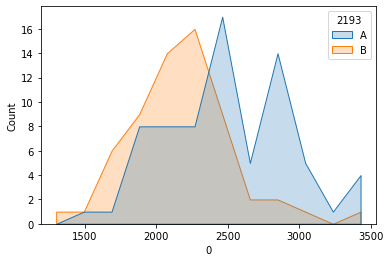

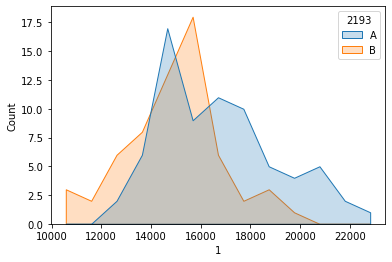

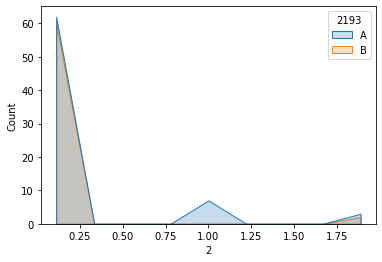

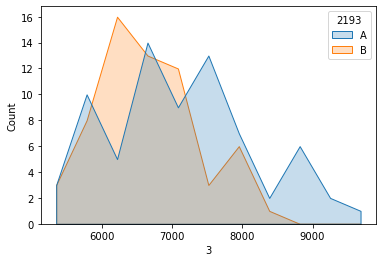

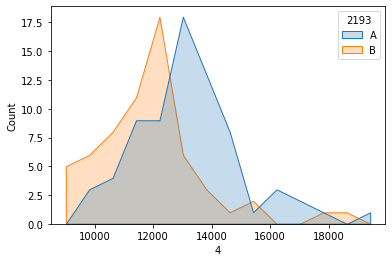

...

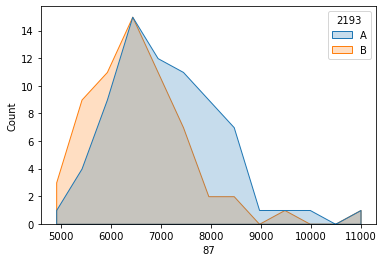

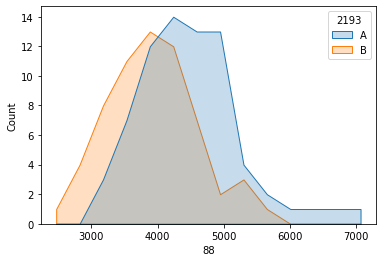

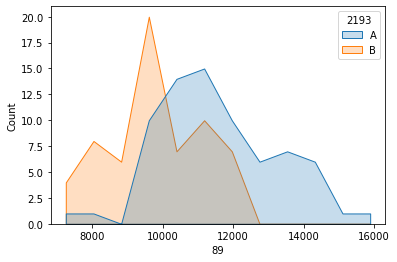

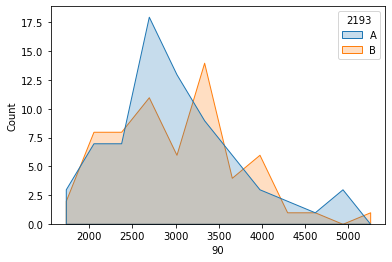

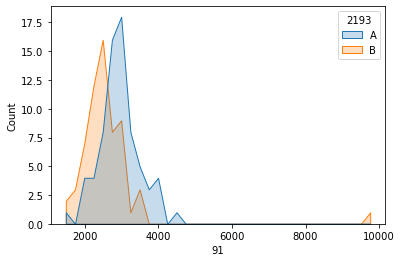

In [43]:
# display(df_strain.head(2))
# display(df_ytrain.head(2))
plt.rcParams.update({'figure.max_open_warning': 0})

display(df_xtest.head(3))
#df_sy.columns = ["yield", "class"]

# print_df_info( (df_xy.iloc[ df_sy["class"]==0, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==1, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==2, : ]) )
# print_df_info( (df_xy.iloc[ df_sy["class"]==3, : ]) )

print(df_xtest.columns)


#fig, axes = plt.subplots(24,4, figsize=(200, 200))
# for i in range(0,92) :
#     sns.histplot(ax=axes[i//4, i%4], data=df_xy, x=str(i), hue="class", element="poly")
# plt.show()

from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('xtest_0to92_dist.pdf') as pdf_pages:
    for i in range(0,92) :
        fig = plt.figure(i)
        sns.histplot(data=df_xtest, x=str(i), hue="2193", element="poly") #, palette=['red', 'blue', 'green', 'black'])
        plt.show()
        fig.savefig(pdf_pages, format='pdf')


### Print Plots to PDF

In [ ]:

with PdfPages('xsy_2191to2193_dist.pdf') as pdf_pages:
    for i, col in tqdm(enumerate(list_xsy_col_name)) :
        print(i,str(col))
        print(np.unique(np.array(df_xsy.loc[:,str(col)])))
        if str(col) == "class" : 
            pass
        else :
            fig = plt.figure(i)
            sns.histplot(data=df_xsy, x=str(col), hue="class", element="poly")
            plt.show()
            fig.savefig(pdf_pages, format='pdf')

## Check 93~2090 distribution

In [89]:
display(df_xtrain_discrete.head(3))
display(df_xsy.head(3))

,93,94,95,96,97,98,99,100,101,102,...,2080,2081,2082,2083,2084,2085,2086,2087,2088,2089
0,0,0,0,1,0,0,0,0,1,1,...,1,1,1,1,1,2,0,0,2,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,1,0,1,0,0,0,2,...,0,0,1,1,1,1,1,0,0,1


,2191,2192,2193,yield,class
0,34.9,0.9,0,0.933333,0
1,26.4,0.8,1,0.966667,0
2,29.4,0.8,0,1.000000,0


In [58]:
list_id= [range(0,601)]
df_discrete_cnt = df_xsy.copy()
display(df_discrete_cnt.index)
df_discrete_cnt["id"] = list(range(1,601))
df_discrete_cnt["cnt0"] = np.zeros(600)
df_discrete_cnt["cnt1"] = np.zeros(600)
df_discrete_cnt["cnt2"] = np.zeros(600)
df_discrete_cnt["cnt12"] = np.zeros(600)


for n, row in enumerate(list(df_xtrain_discrete.index)) :
    df_discrete_cnt.loc[row, "id"] = n
    df_discrete_cnt.loc[row, "count"] = np.sum(np.array(df_xtrain_discrete.loc[n,:]))
#     print(np.unique(np.array(df_xtrain_discrete.loc[row,:]), return_counts=True))
#     print("[", n ,"]", np.sum(np.array(df_xtrain_discrete.loc[n,:])))
    df_discrete_cnt["cnt12"] = (np.count_nonzero(np.array(df_xtrain_discrete.loc[n,:])))
    df_discrete_cnt["cnt0"] = (np.count_nonzero(np.array(df_xtrain_discrete.loc[n,:])==0)  )
    df_discrete_cnt["cnt1"] = (np.count_nonzero(np.array(df_xtrain_discrete.loc[n,:])==1)  )
    df_discrete_cnt["cnt2"] = (np.count_nonzero(np.array(df_xtrain_discrete.loc[n,:])==2)  )
#     print("")

#df_discrete_cnt = pd.concat([df_discrete_cnt, df_xsy], axis=1)
display(df_discrete_cnt.head(3))

RangeIndex(start=0, stop=600, step=1)

,2191,2192,2193,yield,class,id,cnt0,cnt1,cnt2,cnt12,count
0,34.9,0.9,0,0.933333,0,0,1997,0,0,0,1093.0
1,26.4,0.8,1,0.966667,0,1,1997,0,0,0,0.0
2,29.4,0.8,0,1.000000,0,2,1997,0,0,0,1047.0


<Figure size 2304x2304 with 0 Axes>

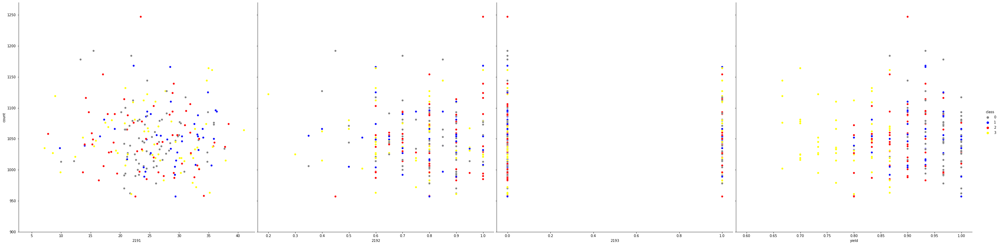

<Figure size 2304x2304 with 0 Axes>

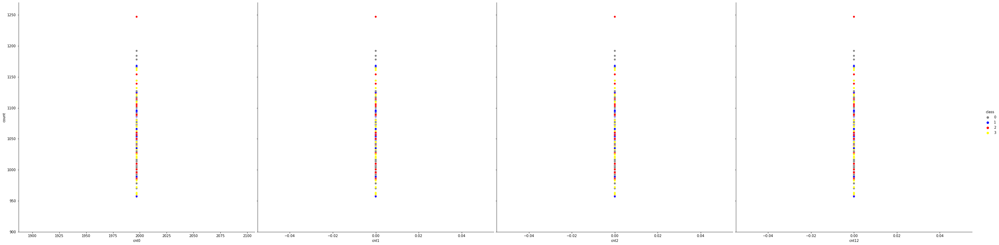

In [116]:

#fig, ax = plt.subplots(2,1, figsize=(15, 10) )
# plt.figure(figsize=(32, 32))





from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('test.pdf') as pdf_pages:

    plt.figure(figsize=(32, 32))
    p1 = sns.pairplot(df_discrete_cnt, 
             x_vars=['2191', '2192', '2193', 'yield'],
             y_vars=['count'], 
             hue='class', palette=['gray', 'blue', 'red', 'yellow'],
             height = 10
             ) #ax=ax[0])
    p1.set(ylim = (900,1270))
    #p1.savefig('saving-a-seaborn-plot-as-pdf-file.pdf')
    pdf_pages.savefig(p1.fig)
    #plt.show()
    
    plt.figure(figsize=(32, 32))
    p2 = sns.pairplot(df_discrete_cnt, 
                 x_vars=[ "cnt0", "cnt1", "cnt2", "cnt12"],
                 y_vars=['count'], 
                 hue='class', palette=['gray', 'blue', 'red', 'yellow'],
                 height = 10
                 ) #ax = ax[1])

    # pairplot.set(xlim=(0,100), ylim = (750,1250))
    p2.set(ylim = (900,1270))
    #p2.savefig(pdf_pages, format='pdf')
    pdf_pages.savefig(p2.fig)

#     plt.show()




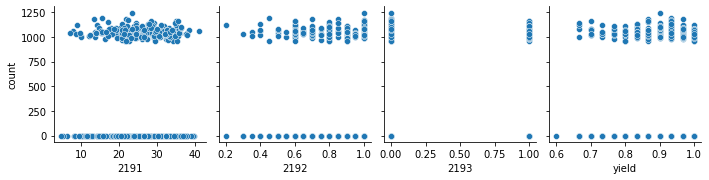

In [131]:
sns.pairplot(df_discrete_cnt, x_vars=['2191', '2192', '2193', 'yield'],
            y_vars=['count'])
plt.show()

## Check Unique value of Categorical data

In [47]:
list_unique = []
for n, row in enumerate(list(df_xtrain_discrete.index)) :
    unique, cnt = np.unique(np.array(df_xtrain_discrete.loc[row,:]), return_counts=True)
    for i in range (0, len(unique)) :
        list_unique.append(unique[i])

        print(set(list_unique))

[0, 1, 2, 0, 0, 1, 2, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 0, 1, 2, 0, 1, 2, 0, 1, 2, 

## Print Image to PDF

In [ ]:
from PIL import Image


# 2022-1208_004.png
# 2022-1208_036.png
# C:\Users\SNUAI\Documents\Sean-Pick
path_png = "c:/Users/SNUAI/Documents/Sean-Pick/2022-1208_0"
#!pip install fpdf

!pwd

from fpdf import FPDF
pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(4,37):
    img = path_png + f"{i:02}" + ".png"
    #display(img)
    cover = Image.open(img)
    width, height = cover.size
    
    pdf.add_page()
    # 1 px = 0.264583 mm (FPDF default is mm)
    pdf.image(img, 0, 0, float(width * 0.264583)*0.6, float(height * 0.264583)*0.6)
    #pdf.image(img)
pdf.output("feature_for_class.pdf")

In [ ]:
print(np.unique(np.array(df_xsy.loc[:,str(col)])))
